<a href="https://colab.research.google.com/github/Zyuuu-G/Bird_CLEF_2023/blob/main/BirdCLEF_Ziyu.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

# Bird CLEF 2023#
Ziyu

4/23/2023

## Importing and "clean up" audio file

In [1]:
import pandas as pd
import numpy as np
import matplotlib.pylab as plt
import seaborn as sns

from glob import glob

import librosa
import librosa.display
import IPython.display as ipd

from itertools import cycle

sns.set_theme(style="white", palette=None)
color_pal = plt.rcParams["axes.prop_cycle"].by_key()["color"]
color_cycle = cycle(plt.rcParams["axes.prop_cycle"].by_key()["color"])

In [2]:
from google.colab import drive
drive.mount('/content/drive') # link to drive to access data files

Drive already mounted at /content/drive; to attempt to forcibly remount, call drive.mount("/content/drive", force_remount=True).


if the tone is all that matters, we can trim the audio sample down 

In [81]:
# import audio files (training data) for African Bare-eyed Thrush (target 'abethr1') 
audio_files0 = glob('/content/drive/MyDrive/Bird_CLIF_2023/birdclef-2023/train_audio/abethr1/*.ogg')
# for (target 'abhori1')
audio_files1 = glob('/content/drive/MyDrive/Bird_CLIF_2023/birdclef-2023/train_audio/abhori1/*.ogg') 

In [78]:
# Play an audio file from 'abethr1'
ipd.Audio(audio_files0[8])

In [92]:
# read files 
raw0 = []
sr =[]
for i in range(len(audio_files0)):
  data, sampleRate = librosa.load(audio_files0[i],sr=32000)  # sample rate = #of datapoints in each second ("sound resolution")
  raw0.append(data)
  sr.append(sampleRate)
raw0 = np.array(raw0,dtype=object)
sr = np.array(sr,dtype=object)
#print(f'raw0 : {raw0[:3]}')
print(f'shape raw0: {raw0.shape}')
print(f'shape raw0[3]: {raw0[3].shape}')
print(f'sample rate: {sr}')
# same sample rate for all audio files but different length

shape raw0: (15,)
shape raw0[3]: (301056,)
sample rate: [32000 32000 32000 32000 32000 32000 32000 32000 32000 32000 32000 32000
 32000 32000 32000]


In [90]:
# Play an audio file from 'abhori1'
ipd.Audio(audio_files1[8])

In [98]:
# read files 
raw1 = []

for i in range(len(audio_files1)):
  data, sampleRate = librosa.load(audio_files1[i],sr=32000)  # sample rate = #of datapoints in each second ("sound resolution")
  raw1.append(data)
raw1 = np.array(raw1,dtype=object)
#print(f'raw1 : {raw1[:3]}')
print(f'shape raw1: {raw1.shape}')
print(f'shape raw1[3]: {raw1[3].shape}')

shape raw1: (126,)
shape raw1[3]: (601861,)


# playing around

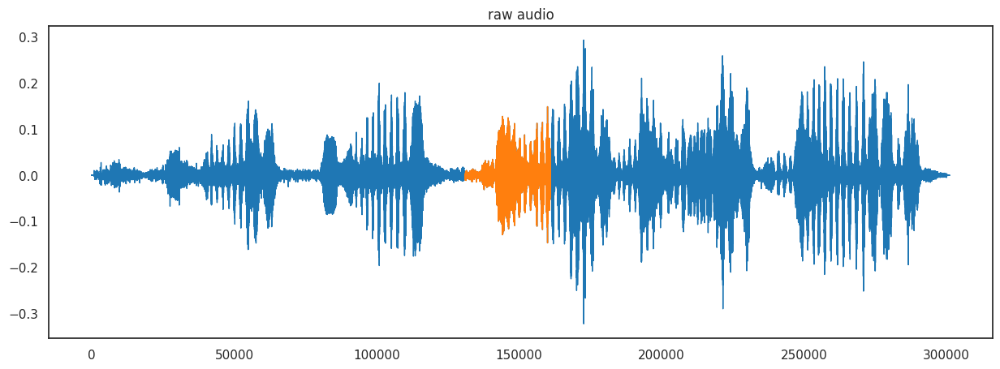

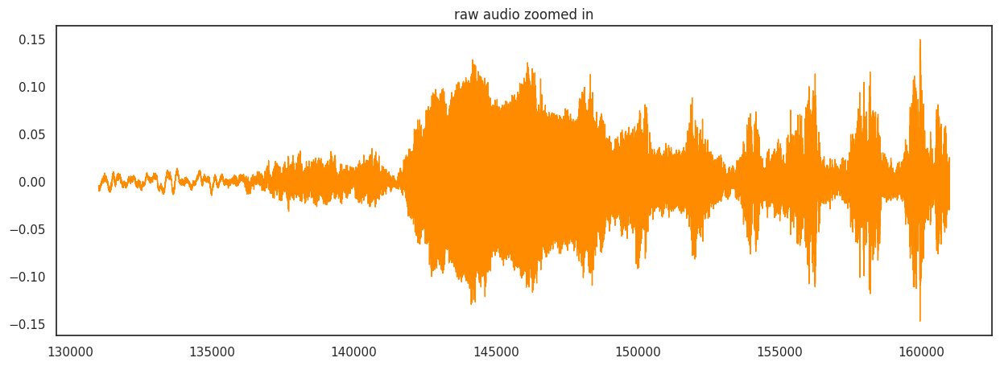

In [99]:
# plot the "sound"
pd.Series(raw0[3]).plot(figsize=(15, 5),lw=1,title='raw audio')
pd.Series(raw0[3])[131000:161000].plot(figsize=(15, 5),lw=1)
plt.show()
pd.Series(raw0[3])[131000:161000].plot(figsize=(15, 5),lw=1,title='raw audio zoomed in',color='darkorange')
plt.show()

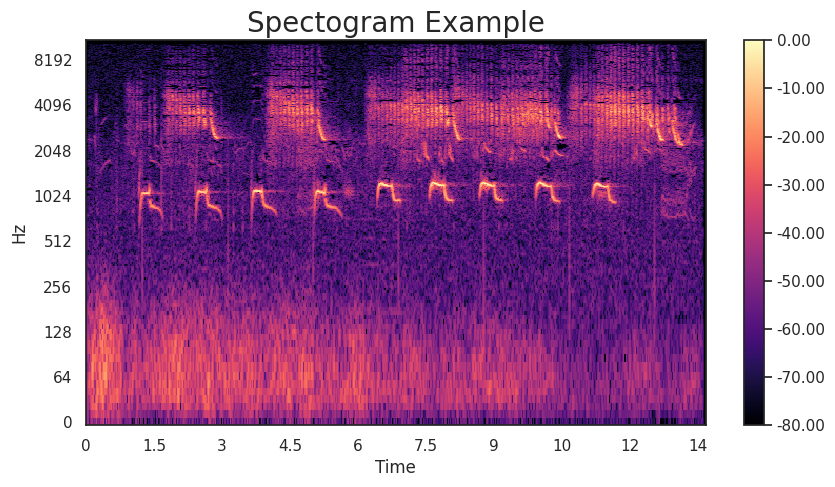

In [100]:

D = librosa.stft(raw0[3])
S_db = librosa.amplitude_to_db(np.abs(D), ref=np.max)
S_db.shape


# Plot the transformed audio data
fig, ax = plt.subplots(figsize=(10, 5))
img = librosa.display.specshow(S_db,x_axis='time',y_axis='log',ax=ax)
ax.set_title('Spectogram Example', fontsize=20)
fig.colorbar(img, ax=ax, format=f'%0.2f')
plt.show()





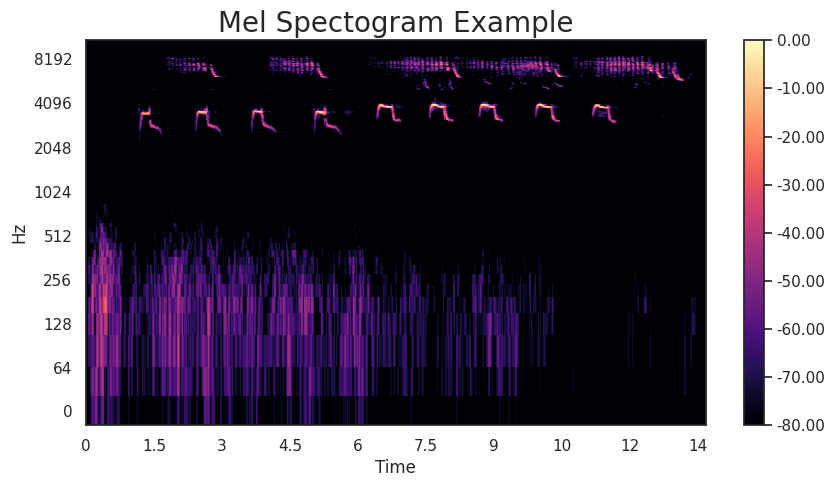

(256, 589)


In [101]:
S = librosa.feature.melspectrogram(y=raw0[3],n_mels=128 * 2,)
S_db_mel = librosa.amplitude_to_db(S, ref=np.max)
fig, ax = plt.subplots(figsize=(10, 5))
# Plot the mel spectogram
img = librosa.display.specshow(S_db_mel,
                              x_axis='time',
                              y_axis='log',
                              ax=ax)
ax.set_title('Mel Spectogram Example', fontsize=20)
fig.colorbar(img, ax=ax, format=f'%0.2f')
plt.show()

print(S_db_mel.shape)

# species 0 (abethr1)

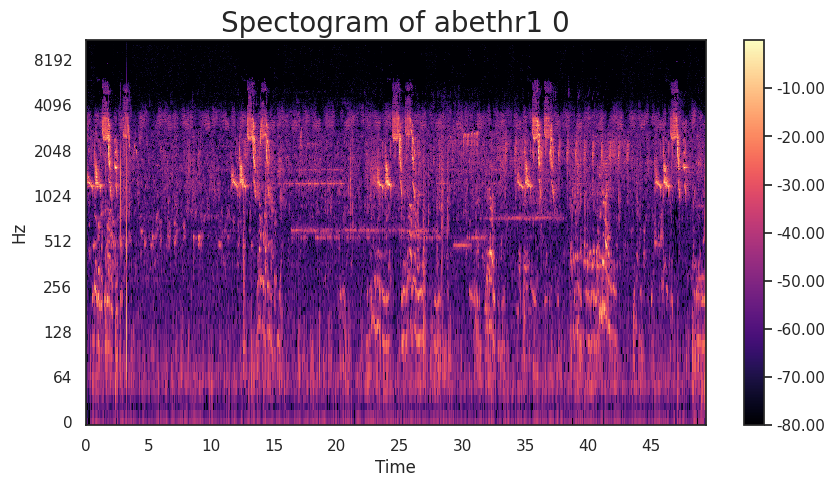

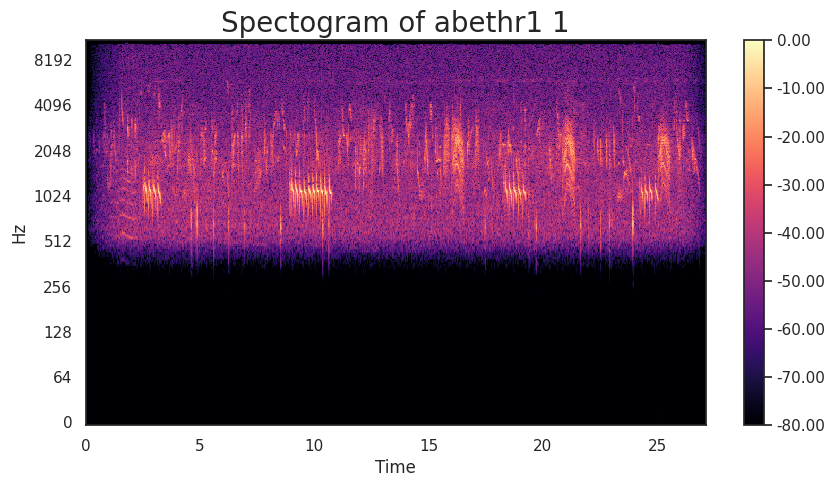

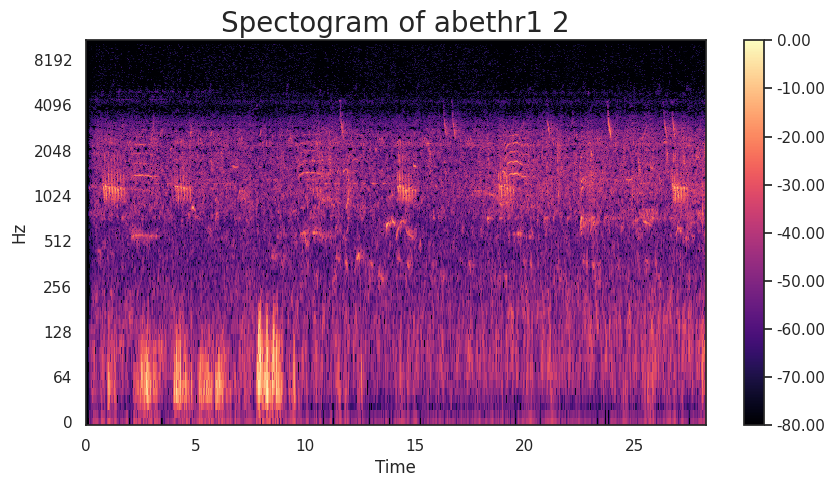

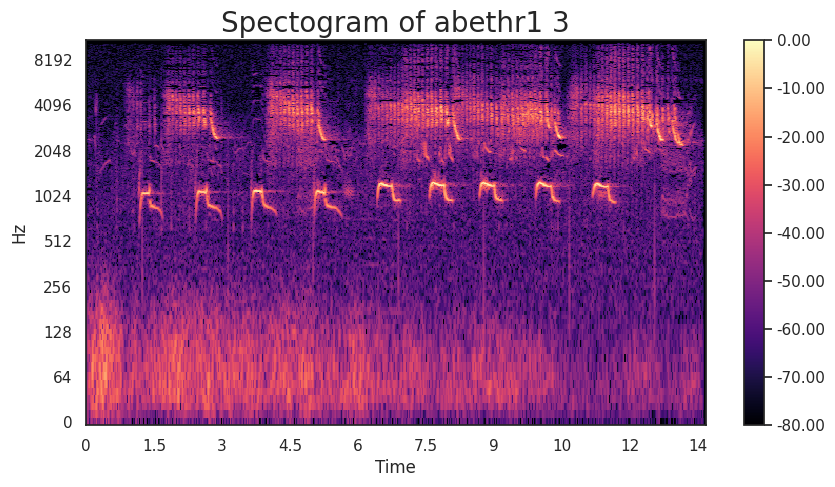

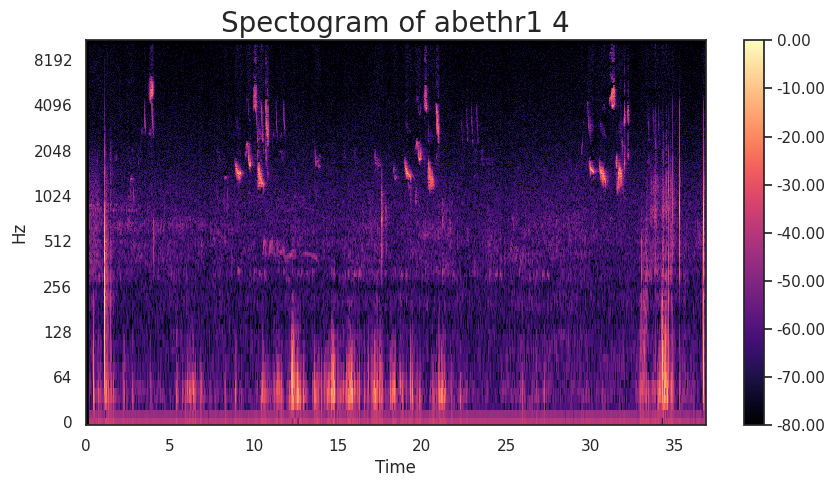

...

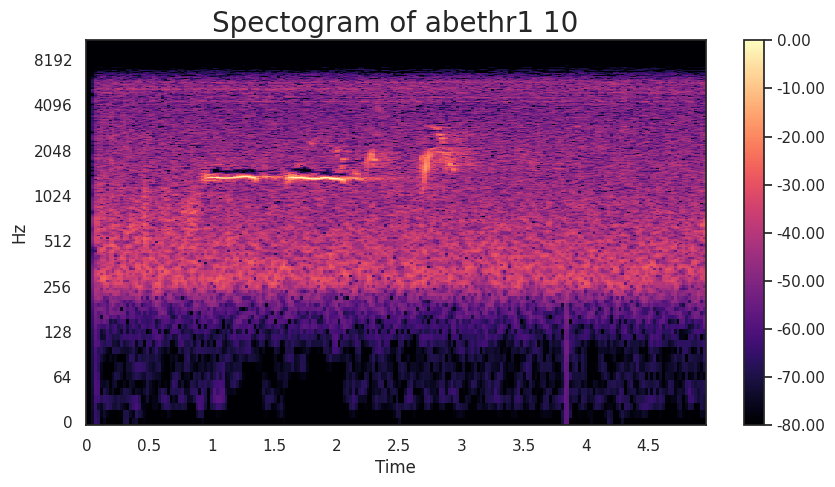

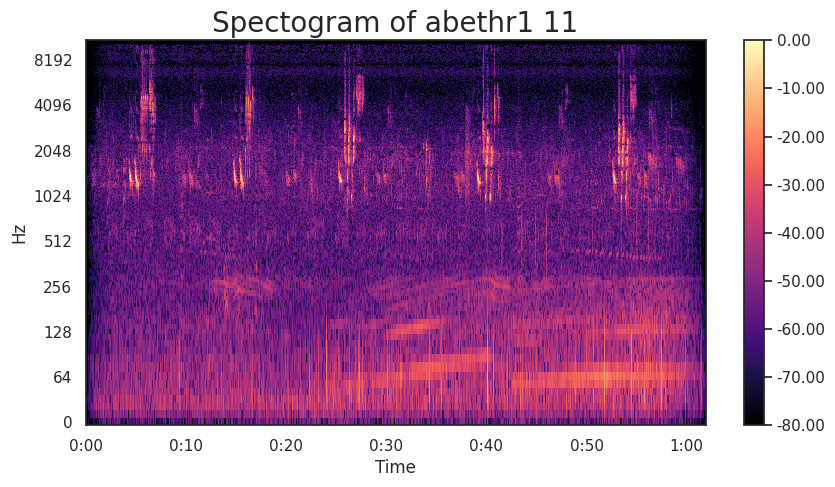

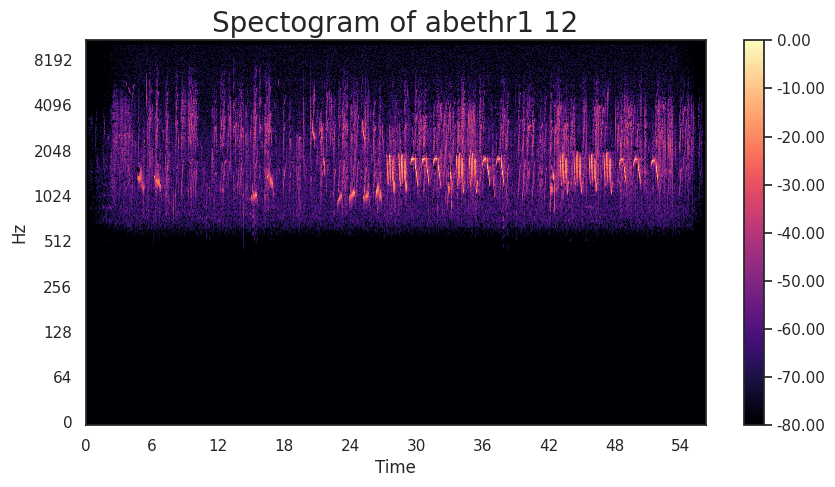

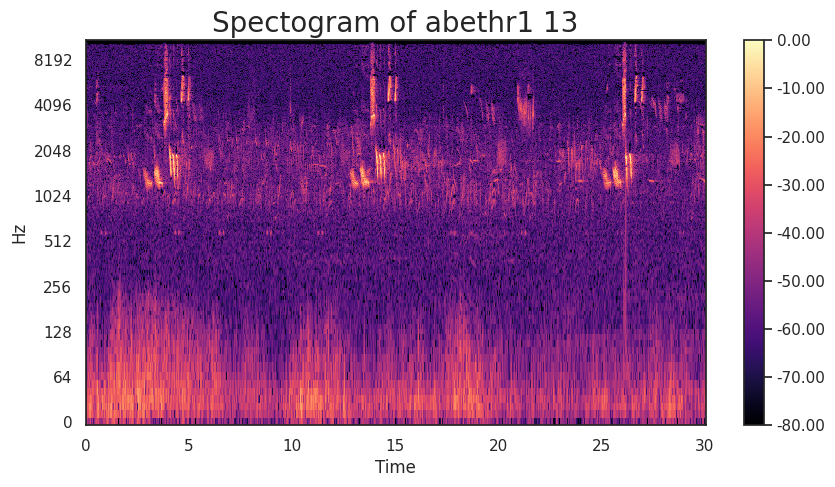

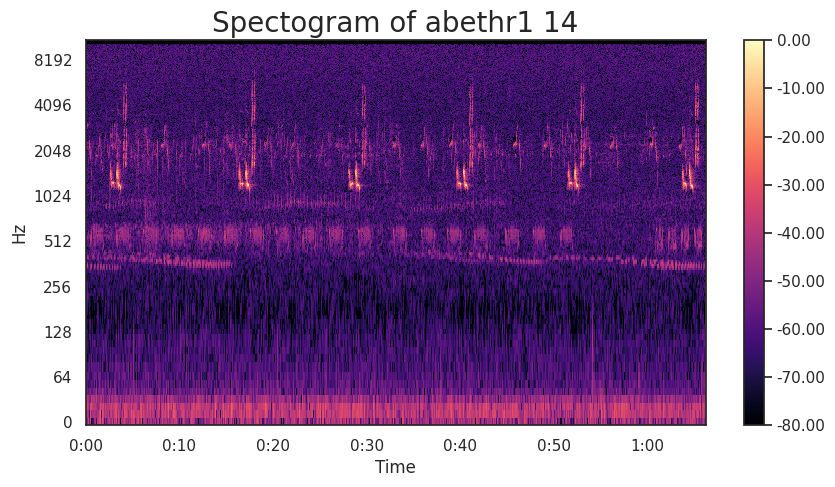

(1025, 589)
15


In [102]:
lessraw0 = []

for i in range(len(raw0)):
    trans = librosa.stft(raw0[i])
    db_mel = librosa.amplitude_to_db(np.abs(trans), ref=np.max)
    lessraw0.append(db_mel)
    fig, ax = plt.subplots(figsize=(10, 5))
    img = librosa.display.specshow(db_mel, x_axis='time', y_axis='log',ax=ax)
    ax.set_title(f'Spectogram of abethr1 {i}', fontsize=20)
    fig.colorbar(img, ax=ax, format=f'%0.2f')
    plt.show()
#rare = np.array(rare,dtype=object)

# Plot the mel spectogram

print(lessraw0[3].shape)
print(len(lessraw0))

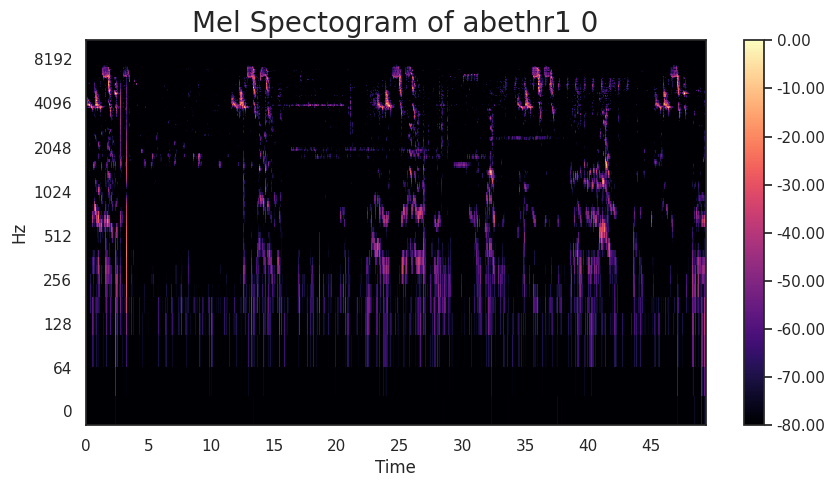

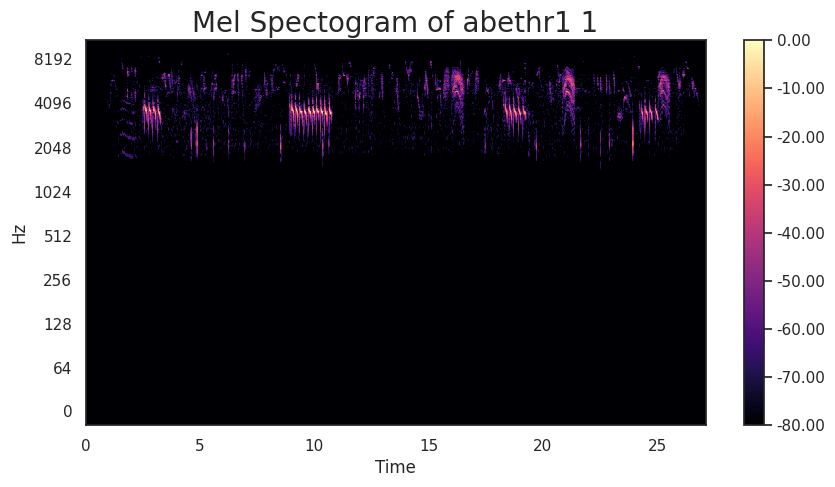

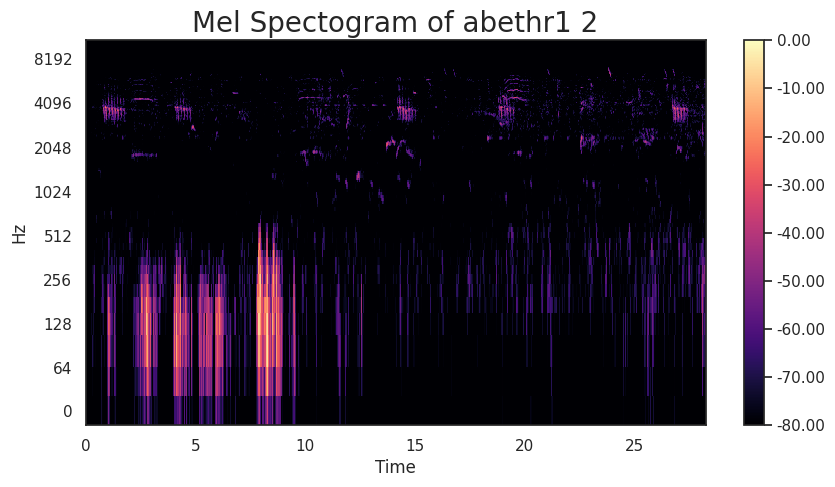

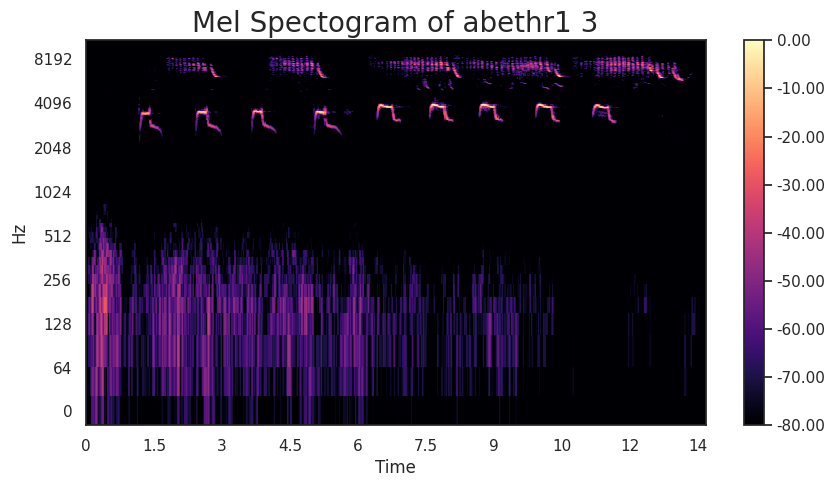

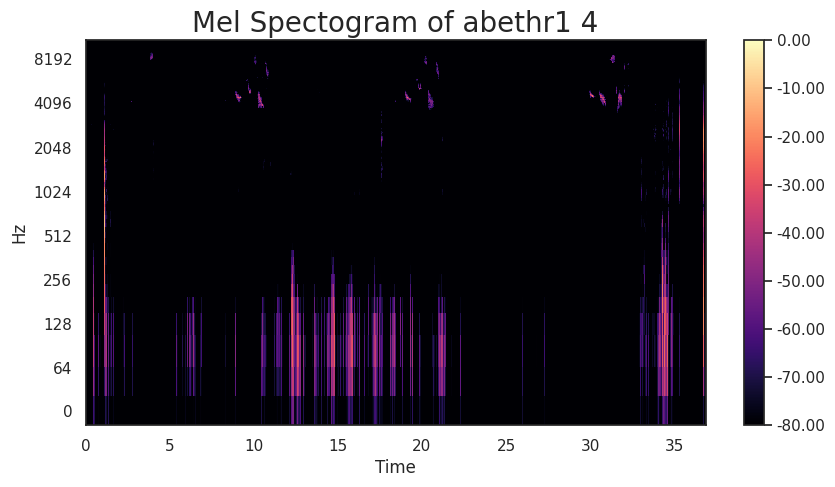

...

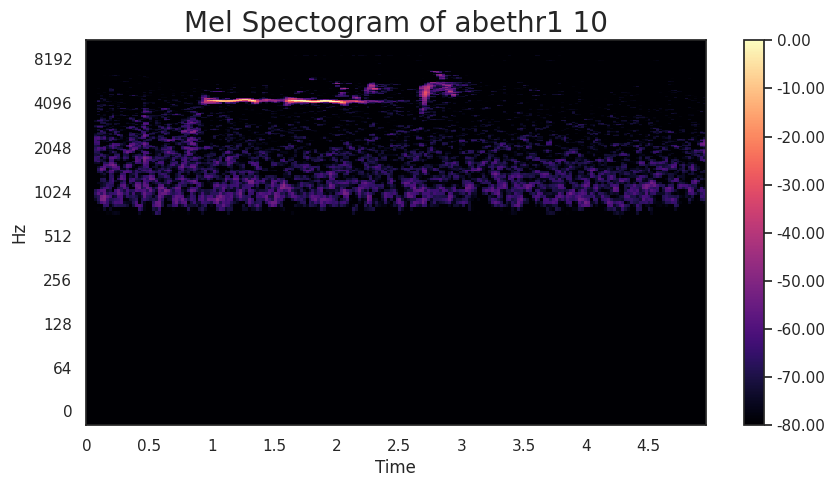

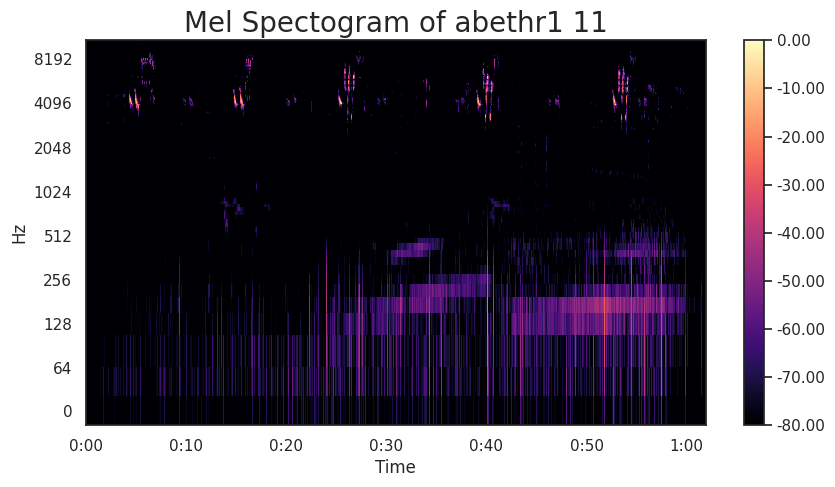

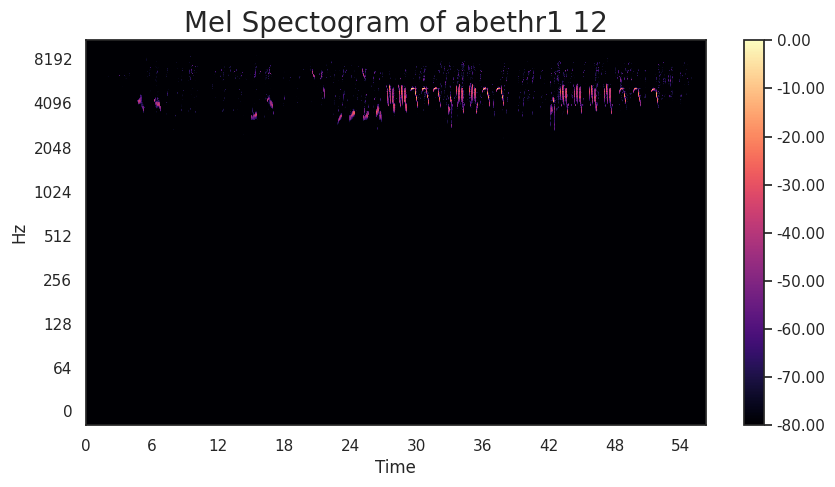

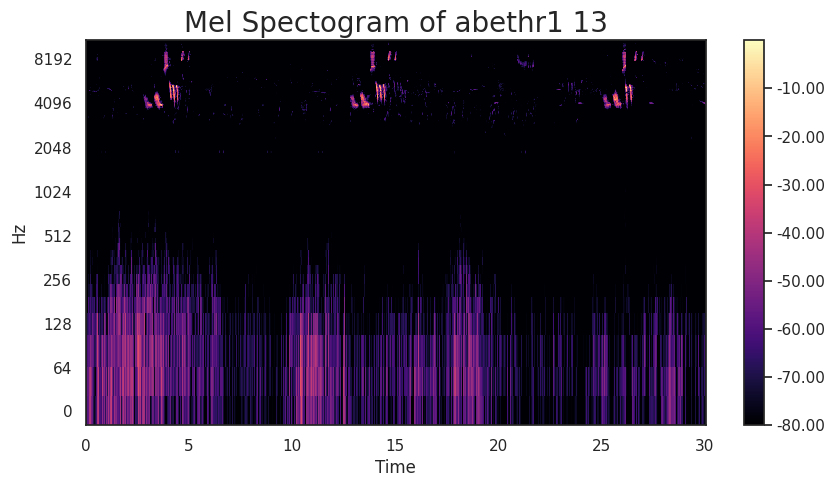

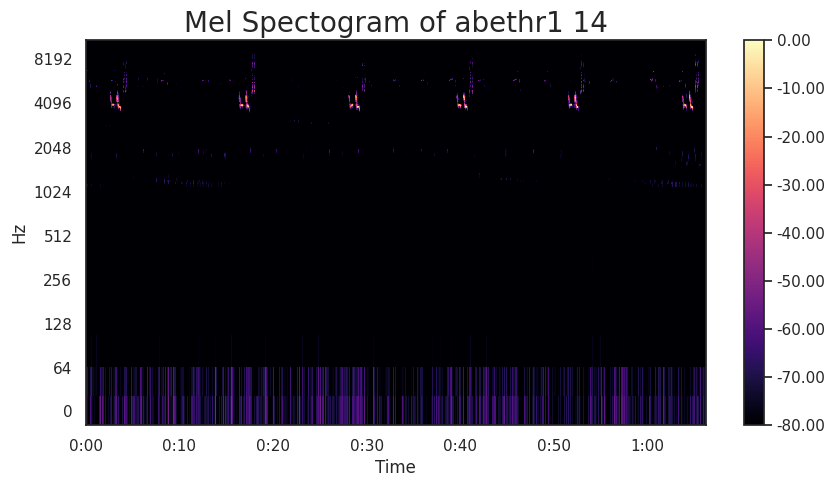

(256, 589)
15


In [103]:
rare0 = []

for i in range(len(raw0)):
    trans = librosa.feature.melspectrogram(y=raw0[i],n_mels=128 * 2,)
    db_mel = librosa.amplitude_to_db(np.abs(trans), ref=np.max)
    rare0.append(db_mel)
    fig, ax = plt.subplots(figsize=(10, 5))
    img = librosa.display.specshow(db_mel, x_axis='time', y_axis='log',ax=ax)
    ax.set_title(f'Mel Spectogram of abethr1 {i}', fontsize=20)
    fig.colorbar(img, ax=ax, format=f'%0.2f')
    plt.show()
#rare = np.array(rare,dtype=object)

# Plot the mel spectogram

print(rare0[3].shape)
print(len(rare0))

# species 1 (abhori1)

In [106]:
lessraw1 = []

for i in range(len(raw1)):
    trans = librosa.stft(raw1[i])
    db_mel = librosa.amplitude_to_db(np.abs(trans), ref=np.max)
    lessraw1.append(db_mel)
   
#rare = np.array(rare,dtype=object)

# Plot the mel spectogram

print(lessraw1[3].shape)
print(len(lessraw1))

(1025, 1176)
126


In [114]:
rare1 = []

for i in range(len(raw1)):
    trans = librosa.feature.melspectrogram(y=raw1[i],n_mels=128 * 2,)
    db_mel = librosa.amplitude_to_db(np.abs(trans), ref=np.max)
    rare1.append(db_mel)
   
#rare = np.array(rare,dtype=object)

# Plot the mel spectogram
'''
fig, ax = plt.subplots(figsize=(10, 5))
img = librosa.display.specshow(db_mel, x_axis='time', y_axis='log',ax=ax)
ax.set_title(f'Spectogram of abhori1 {}', fontsize=20)
fig.colorbar(img, ax=ax, format=f'%0.2f')
plt.show()
'''
print(rare1[3].shape)
print(len(rare1))

(256, 1176)
126


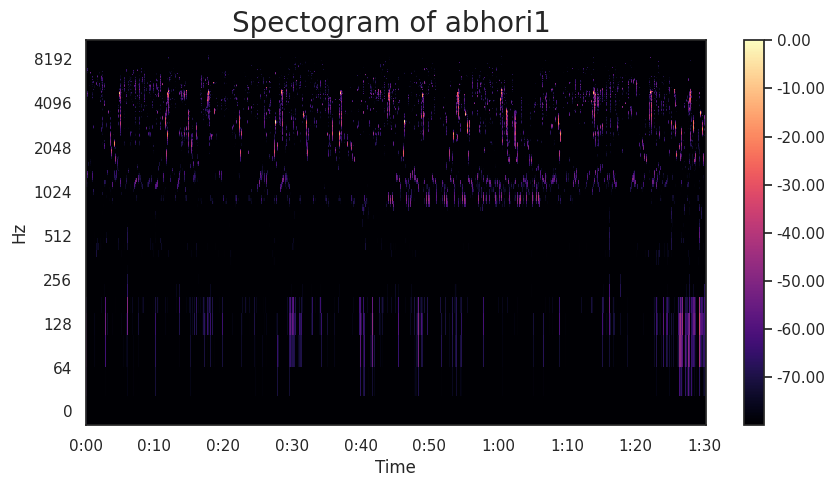

In [116]:
fig, ax = plt.subplots(figsize=(10, 5))
img = librosa.display.specshow(rare1[9], x_axis='time', y_axis='log',ax=ax)
ax.set_title(f'Spectogram of abhori1 ', fontsize=20)
fig.colorbar(img, ax=ax, format=f'%0.2f')
plt.show()

#get features

In [121]:
mfccs = librosa.feature.mfcc(raw0[3])
print(mfccs.shape)
#Displaying  the MFCCs:
librosa.display.specshow(mfccs, sr=sr, x_axis='time')

TypeError: ignored

In [ ]:

# Load in audio
rb, sr = librosa.load('snippets/rb.wav')
rap, _ = librosa.load('snippets/rap.wav')
rock, _ = librosa.load('snippets/rock.wav')

# Create chromagrams
rb_chroma = librosa.feature.chroma_stft(rb, sr=sr)
rap_chroma = librosa.feature.chroma_stft(rap, sr=sr)
rock_chroma = librosa.feature.chroma_stft(rock, sr=sr)

# Visualize the STFT chromagrams
fig, ax = plt.subplots(1,3, figsize=(30,15))
img = librosa.display.specshow(rb_chroma, y_axis = 'chroma', x_axis='time', ax=ax[0])
ax[0].set(title = 'R&B Chromagram')
librosa.display.specshow(rap_chroma, y_axis = 'chroma', x_axis='time', ax=ax[1])
ax[1].set(title = 'Rap Chromagram')
librosa.display.specshow(rock_chroma, y_axis = 'chroma', x_axis='time', ax=ax[2])
ax[2].set(title = 'Rock Chromagram')
fig.colorbar(img, ax=ax)
plt.show()

#couple the feature with targets